# Exploring Data with Python

## Load the data

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import cluster, decomposition, pipeline, preprocessing


In [2]:
url = 'https://github.com/mattharrison/datasets/raw/master/data/vehicles.csv.zip'
auto = pd.read_csv(url)

/var/folders/qn/r8_0pgj1645dn1w69vqls6cw0000gn/T/ipykernel_9220/590951226.py:2: DtypeWarning: Columns (68,70,71,72,73,74,76,79) have mixed types. Specify dtype option on import or set low_memory=False.
  auto = pd.read_csv(url)


In [4]:
auto

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,...,mfrCode,c240Dscr,charge240b,c240bDscr,createdOn,modifiedOn,startStop,phevCity,phevHwy,phevComb
0,15.695714,0.0,0.0,0.0,19,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
1,29.964545,0.0,0.0,0.0,9,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
2,12.207778,0.0,0.0,0.0,23,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
3,29.964545,0.0,0.0,0.0,10,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
4,17.347895,0.0,0.0,0.0,17,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41139,14.982273,0.0,0.0,0.0,19,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
41140,14.330870,0.0,0.0,0.0,20,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
41141,15.695714,0.0,0.0,0.0,18,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0
41142,15.695714,0.0,0.0,0.0,18,0.0,0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,Tue Jan 01 00:00:00 EST 2013,Tue Jan 01 00:00:00 EST 2013,NaN,0,0,0


## Exploring Columns

In [ ]:
auto.dtypes

barrels08          float64
barrelsA08         float64
charge120          float64
charge240          float64
city08               int64
city08U            float64
cityA08              int64
cityA08U           float64
cityCD             float64
cityE              float64
cityUF             float64
co2                  int64
co2A                 int64
co2TailpipeAGpm    float64
co2TailpipeGpm     float64
comb08               int64
comb08U            float64
combA08              int64
combA08U           float64
combE              float64
combinedCD         float64
combinedUF         float64
cylinders          float64
displ              float64
drive               object
engId                int64
eng_dscr            object
feScore              int64
fuelCost08           int64
fuelCostA08          int64
                    ...   
rangeCity          float64
rangeCityA         float64
rangeHwy           float64
rangeHwyA          float64
trany               object
UCity              float64
U

In [6]:
# missing data
((auto
  .isna()
  .mean()
  * 100
 )
  #.pipe(lambda ser : ser[ser > 0])
)

barrels08      0.000000
barrelsA08     0.000000
charge120      0.000000
charge240      0.000000
city08         0.000000
                ...    
modifiedOn     0.000000
startStop     77.056193
phevCity       0.000000
phevHwy        0.000000
phevComb       0.000000
Length: 83, dtype: float64

In [ ]:
auto.loc[auto.cylinders.isna(), ['make', 'model', 'year']]

,make,model,year
7138,Nissan,Altra EV,2000
7139,Toyota,RAV4 EV,2000
8143,Toyota,RAV4 EV,2001
8144,Ford,Th!nk,2001
8146,Ford,Explorer USPS Electric,2001
8147,Nissan,Hyper-Mini,2001
9212,Toyota,RAV4 EV,2002
9213,Ford,Explorer USPS Electric,2002
10329,Toyota,RAV4 EV,2003
21413,Subaru,RX Turbo,1985


In [7]:
# Just look at categorical columns
auto.select_dtypes(include=[object]).dtypes

drive         object
eng_dscr      object
fuelType      object
fuelType1     object
make          object
model         object
mpgData       object
trany         object
VClass        object
guzzler       object
trans_dscr    object
tCharger      object
sCharger      object
atvType       object
fuelType2     object
rangeA        object
evMotor       object
mfrCode       object
c240Dscr      object
c240bDscr     object
createdOn     object
modifiedOn    object
startStop     object
dtype: object

In [8]:
auto.drive.value_counts()

drive
Front-Wheel Drive             14236
Rear-Wheel Drive              13831
4-Wheel or All-Wheel Drive     6648
All-Wheel Drive                3015
4-Wheel Drive                  1460
2-Wheel Drive                   507
Part-time 4-Wheel Drive         258
Name: count, dtype: int64

In [9]:
auto.drive.value_counts(dropna=False)

drive
Front-Wheel Drive             14236
Rear-Wheel Drive              13831
4-Wheel or All-Wheel Drive     6648
All-Wheel Drive                3015
4-Wheel Drive                  1460
NaN                            1189
2-Wheel Drive                   507
Part-time 4-Wheel Drive         258
Name: count, dtype: int64

In [10]:
auto.fuelType2.value_counts()

fuelType2
E85            1444
Electricity     134
Natural Gas      20
Propane           8
Name: count, dtype: int64

In [11]:
auto.VClass.value_counts()

VClass
Compact Cars                          5886
Subcompact Cars                       5155
Midsize Cars                          4858
Standard Pickup Trucks                2354
Large Cars                            2179
Sport Utility Vehicle - 4WD           2090
Two Seaters                           2076
Sport Utility Vehicle - 2WD           1627
Small Station Wagons                  1605
Special Purpose Vehicles              1455
Minicompact Cars                      1383
Standard Pickup Trucks 2WD            1263
Vans                                  1141
Standard Pickup Trucks 4WD            1087
Small Sport Utility Vehicle 4WD        847
Special Purpose Vehicle 2WD            664
Standard Sport Utility Vehicle 4WD     663
Midsize-Large Station Wagons           656
Small Sport Utility Vehicle 2WD        595
Midsize Station Wagons                 544
Small Pickup Trucks                    538
Small Pickup Trucks 2WD                468
Vans, Cargo Type                       438
Mini

In [12]:
auto.atvType.value_counts()

atvType
FFV               1444
Diesel            1108
Hybrid             593
EV                 203
Plug-in Hybrid     134
CNG                 50
Bifuel (CNG)        20
Bifuel (LPG)         8
Name: count, dtype: int64

In [13]:
auto.make.value_counts()

make
Chevrolet                      4003
Ford                           3371
Dodge                          2583
GMC                            2494
Toyota                         2071
                               ... 
Volga Associated Automobile       1
Panos                             1
Mahindra                          1
Excalibur Autos                   1
London Coach Co Inc               1
Name: count, Length: 136, dtype: int64

## Visualizations

<Axes: xlabel='make'>

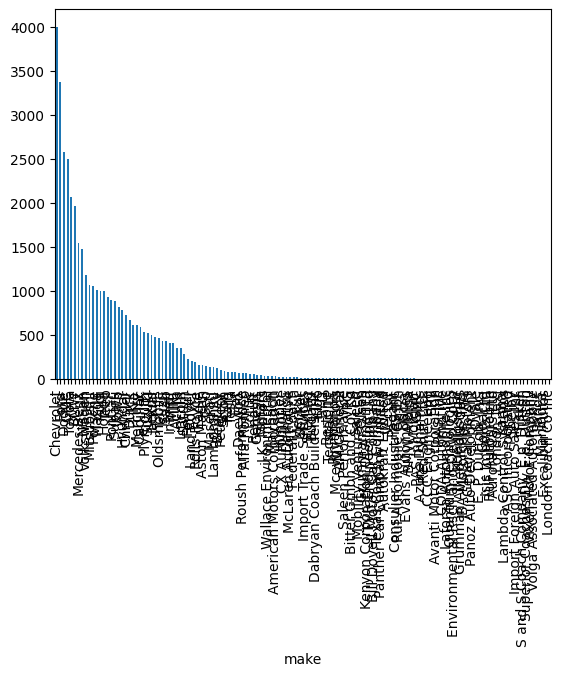

In [14]:
auto.make.value_counts().plot.bar()

<Axes: xlabel='make'>

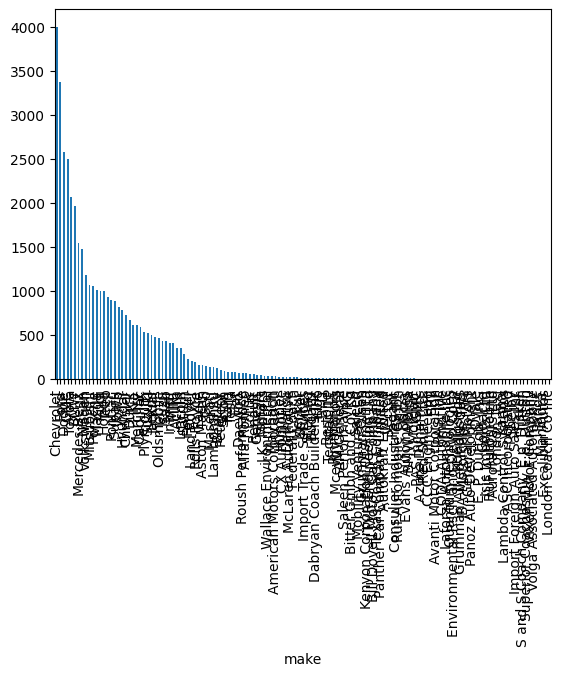

In [15]:
(auto
.make
.value_counts()
.plot.bar()
)

<Axes: ylabel='make'>

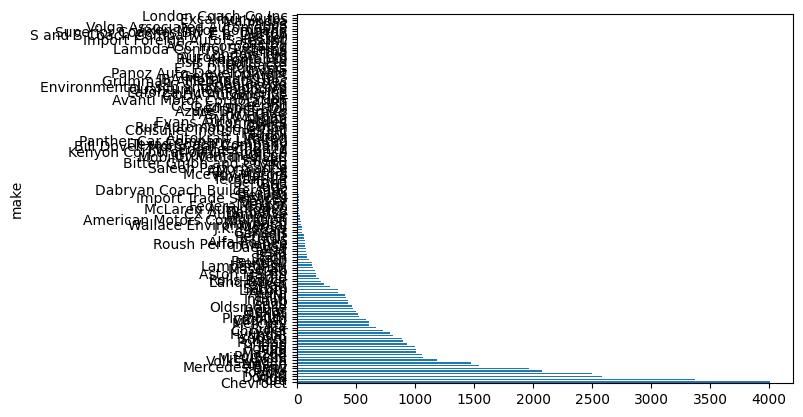

In [16]:
(auto
.make
.value_counts()
.plot.barh()
)

<Axes: ylabel='make'>

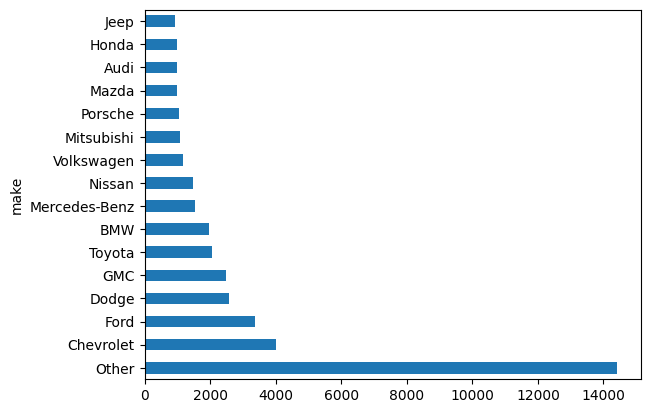

In [22]:
# limit amounts
make_counts = auto.make.value_counts()
limit = 15
(auto
.make.where(auto.make.isin(make_counts.index[:limit]), 'Other')
.value_counts()
.plot.barh()
)

## Summary Stats

In [ ]:
# get summary stats
auto.describe()

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,cityUF,co2,co2A,co2TailpipeAGpm,co2TailpipeGpm,comb08,comb08U,combA08,combA08U,combE,combinedCD,combinedUF,cylinders,displ,engId,feScore,fuelCost08,fuelCostA08,ghgScore,ghgScoreA,highway08,highway08U,highwayA08,highwayA08U,highwayCD,highwayE,highwayUF,hlv,hpv,id,lv2,lv4,pv2,pv4,range,rangeCity,rangeCityA,rangeHwy,rangeHwyA,UCity,UCityA,UHighway,UHighwayA,year,youSaveSpend,charge240b,phevCity,phevHwy,phevComb
count,41144.000000,41144.000000,41144.0,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,40938.000000,40940.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000,41144.000000
mean,17.283900,0.220294,0.0,0.044872,18.369045,5.978814,0.665808,0.519901,0.000461,0.322713,0.001583,87.969959,5.885402,17.606582,466.364937,20.616396,6.673512,0.725087,0.556758,0.329781,0.000356,0.001561,5.717084,3.294238,8166.812366,0.359348,2362.335942,85.567762,0.357306,-0.920717,24.504667,7.877058,0.828602,0.626688,0.000238,0.338852,0.001533,2.006732,10.266017,20689.602324,1.806314,6.114087,13.529069,33.806144,0.793506,0.763727,0.086503,0.733660,0.079749,23.204206,0.861106,34.343752,1.144059,2001.535266,-4056.132121,0.009668,0.153339,0.152999,0.152513
std,4.623232,1.140919,0.0,0.602894,7.905886,11.644783,5.225626,5.074261,0.038774,3.788006,0.029167,174.872749,57.217534,93.175192,123.621106,7.674535,12.332353,5.253572,5.053964,3.838108,0.033974,0.028740,1.755517,1.357151,17260.059211,2.699179,654.981925,449.482202,2.696342,0.660101,7.730364,13.845554,5.462747,5.190545,0.028407,3.919604,0.028215,5.937790,28.025695,12002.135928,4.363409,9.636260,31.085800,46.026821,13.041592,13.031355,1.978088,12.851572,1.762992,11.232357,7.325415,11.259252,7.765665,11.142414,3281.796526,0.232397,2.946152,2.825546,2.873408
min,0.060000,0.000000,0.0,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,-1.000000,500.000000,0.000000,-1.000000,-1.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1984.000000,-29250.000000,0.000000,0.000000,0.000000,0.000000
25%,14.330870,0.000000,0.0,0.000000,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,386.391304,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2.200000,0.000000,-1.000000,1900.000000,0.000000,-1.000000,-1.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10286.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.239750,0.000000,27.895500,0.000000,1991.000000,-5750.000000,0.000000,0.000000,0.000000,0.000000
50%,16.480500,0.000000,0.0,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,444.350000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,3.000000,182.000000,-1.000000,2350.000000,0.000000,-1.000000,-1.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20573.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21.400000,0.000000,33.235700,0.000000,2002.00

In [28]:
# inspect a single column
auto.city08.describe()

count    41144.000000
mean        18.369045
std          7.905886
min          6.000000
25%         15.000000
50%         17.000000
75%         20.000000
max        150.000000
Name: city08, dtype: float64

<Axes: >

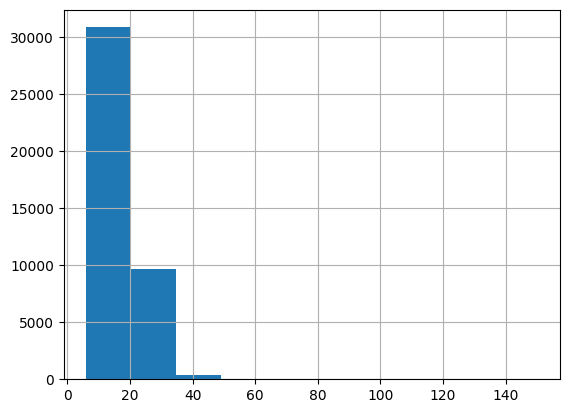

In [29]:
auto.city08.hist()

<Axes: >

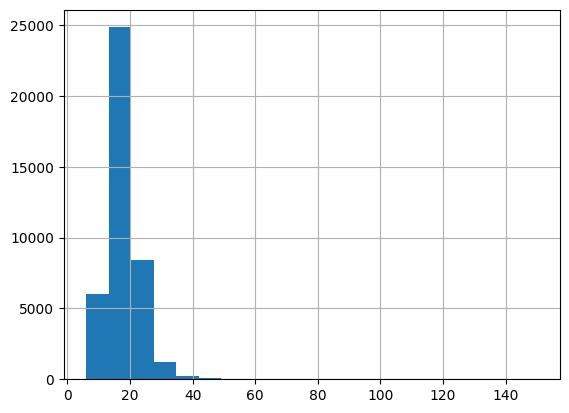

In [30]:
# change number of bins
auto.city08.hist(bins=20)

In [31]:
auto.city08.quantile([.1, .2, .3])

0.1    13.0
0.2    14.0
0.3    15.0
Name: city08, dtype: float64

<Axes: ylabel='bin'>

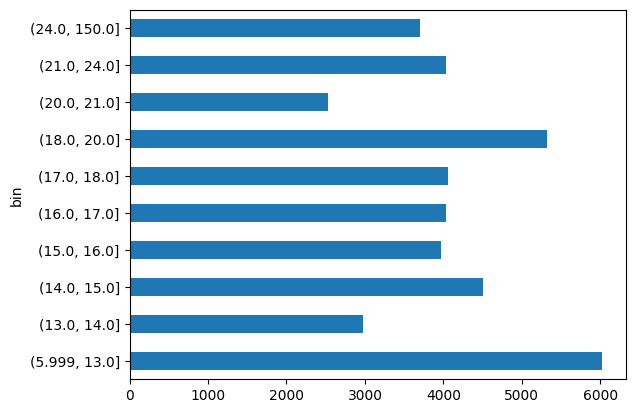

In [33]:

# quantile cut - put in 10 buckets (deciles)
(auto
  .assign(bin=pd.qcut(auto.city08, 10))
  .groupby('bin', observed=True)
  .size()
  .plot.barh()
)

<Axes: ylabel='bin'>

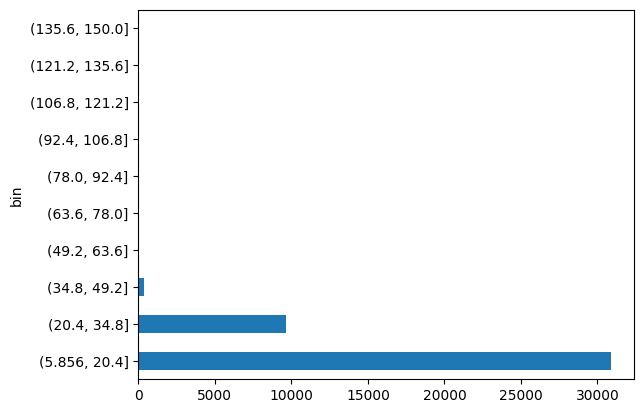

In [36]:
# cut - 10 equal width bins (histogram does this)
(auto
  .assign(bin=pd.cut(auto.city08, 10))
  .groupby('bin', observed=True)
  .size()
  .plot.barh()
)

<Axes: ylabel='bin'>

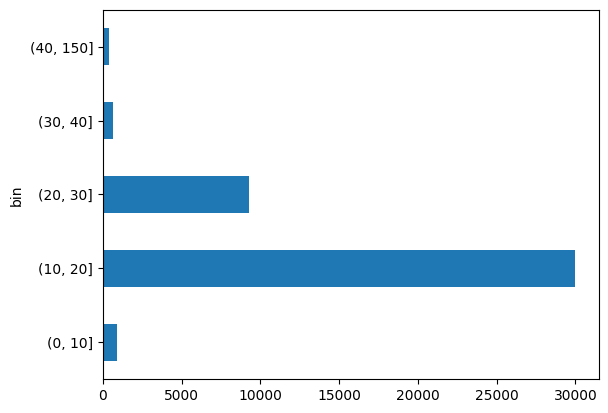

In [37]:
# specify your own cut points
(auto
  .assign(bin=pd.cut(auto.city08, [0, 10, 20, 30, 40, 150]))
  .groupby('bin', observed=True)
  .size()
  .plot.barh()
)

## Relationships and Correlations

In [38]:
# relationships
# continuous vs continuous
auto.city08.corr(auto.highway08)

np.float64(0.9393654130640555)

<Axes: xlabel='city08', ylabel='highway08'>

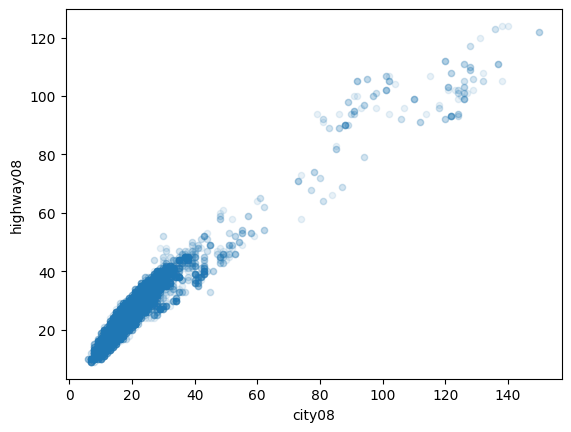

In [39]:
auto.plot.scatter(x='city08', y='highway08', alpha=.1)

ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not array(['Alfa Romeo', 'Ferrari', 'Dodge', ..., 'Subaru', 'Subaru',
       'Subaru'], dtype=object)

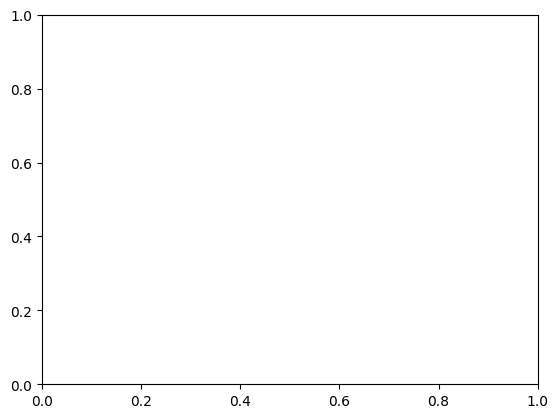

In [44]:
auto.plot.scatter(x='city08', y='highway08', alpha=.1, c='make')

/var/folders/qn/r8_0pgj1645dn1w69vqls6cw0000gn/T/ipykernel_8887/4061491991.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df : df.plot.scatter(x='city08', y='highway08', alpha=1, ax=ax, c=get_color(df.name), label=df.name))


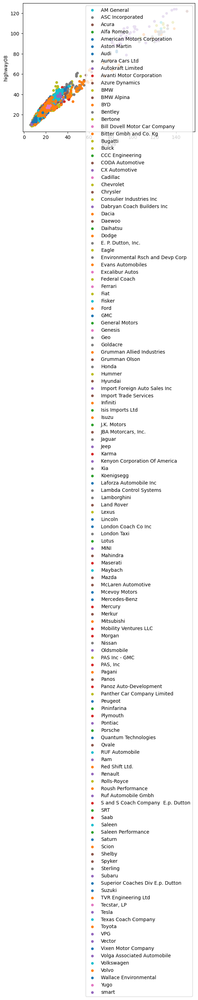

In [60]:
fig, ax = plt.subplots()
def get_color(make):
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    return colors[hash(make) % len(colors)]
(auto
.groupby('make')
.apply(lambda df : df.plot.scatter(x='city08', y='highway08', alpha=1, ax=ax, c=get_color(df.name), label=df.name))
)
ax.legend()

In [66]:
plt.rcParams['axes.prop_cycle'].by_key()['color'][len(seen)]

'#1f77b4'
'#ff7f0e'
'#2ca02c'
'#d62728'
'#9467bd'
'#8c564b'
'#e377c2'
'#7f7f7f'
'#bcbd22'
'#17becf'


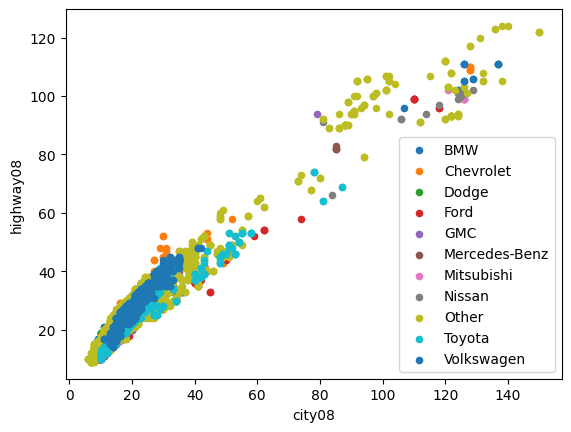

In [70]:
fig, ax = plt.subplots() 
n = 10
top_n_makes = auto.make.value_counts().index[:n]
seen = {}

def get_color(make):
    if make in seen:
        return seen[make]
    else:
        try:
            color = plt.rcParams['axes.prop_cycle'].by_key()['color'][len(seen) % 10]
        except IndexError:
            print(f'ERR {len(seen)}: {make} {seen=}')
        seen[make] = color
        return color

(auto
.assign(make=lambda df : df.make.where(df.make.isin(top_n_makes), 'Other'))
.groupby('make')
.apply(lambda df : df.plot.scatter(x='city08', y='highway08', alpha=1, ax=ax, c=get_color(df.name), label=df.name),  include_groups=False)
)
ax.legend()

<Axes: xlabel='city08', ylabel='highway08'>

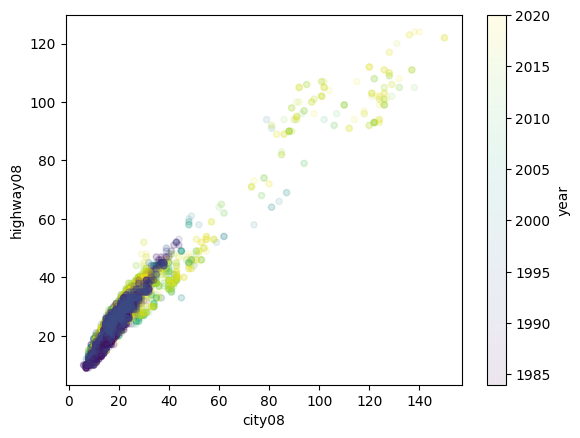

In [45]:
auto.plot.scatter(x='city08', y='highway08', alpha=.1, c='year', cmap='viridis')    

## Line Plots

In [72]:
# time - avg mpg over years for 4 makes
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .groupby(['year', 'make'])
  ['city08']
  .mean()
  .unstack()
)
ax

make,BMW,Ford,Tesla,Toyota
year,,,,
1984,17.625000,15.432203,NaN,22.402597
1985,16.923077,16.505376,NaN,21.868852
1986,16.181818,16.891667,NaN,20.017544
1987,15.153846,15.852174,NaN,20.031250
1988,14.526316,15.690909,NaN,19.633803
1989,14.272727,15.411215,NaN,19.212121
1990,14.933333,14.911504,NaN,18.741379
1991,14.516129,15.313725,NaN,18.224138
1992,14.277778,15.677083,NaN,17.862069


<Axes: xlabel='year'>

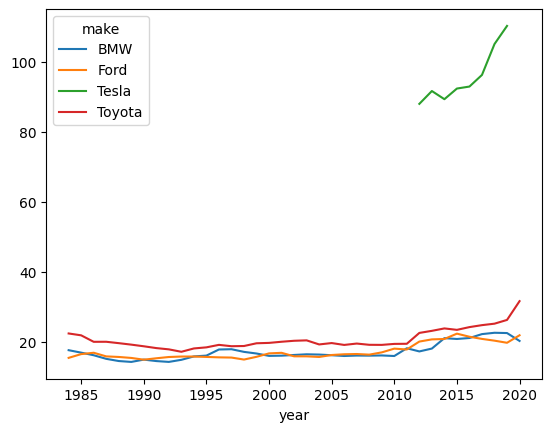

In [ ]:
# time - avg mpg over years
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .groupby(['year', 'make'])
  ['city08']
  .mean()
  .unstack()
  .plot()
)
ax

(0.0, 35.0)

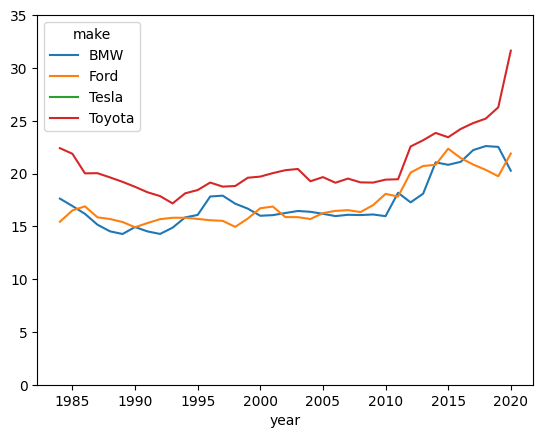

In [73]:
# Change y-axis
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .groupby(['year', 'make'])
  ['city08']
  .mean()
  .unstack()
  .plot()
)
ax.set_ylim(0, 35)

## Plotting Style

Use the Economist style:
https://twitter.com/ECONdailycharts/status/1513619997943386112

# Trying to create Economist style plot
https://twitter.com/ECONdailycharts/status/1513619997943386112

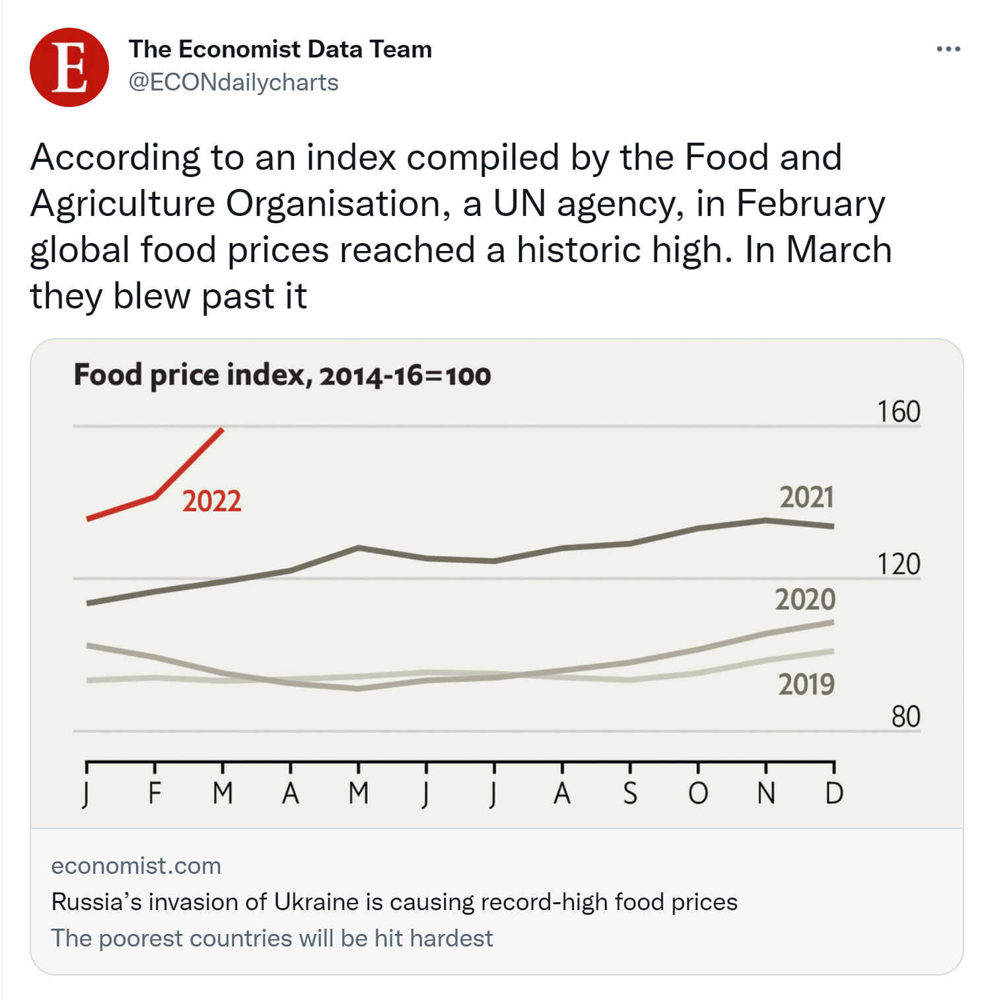

In [ ]:
# run two cells below if you don't have the Roboto font (and don't want warnings)

In [ ]:
!wget 'https://github.com/google/fonts/raw/refs/heads/main/ofl/roboto/Roboto%5Bwdth,wght%5D.ttf'

In [ ]:

from matplotlib import font_manager as fm, pyplot as plt

# Pick up any fonts in the current directory.
# If you do end up downloading the fonts to /usr/share/fonts/truetype,
# change this to: fm.findSystemFonts()
font_files = fm.findSystemFonts('.')

# Go through and add each to Matplotlib's font cache.
for font_file in font_files:
    fm.fontManager.addfont(font_file)

# Use your new font on all your plots.
plt.rc('font', family='Roboto')

/var/folders/qn/r8_0pgj1645dn1w69vqls6cw0000gn/T/ipykernel_8887/2036092946.py:5: DtypeWarning: Columns (68,70,71,72,73,74,76,79) have mixed types. Specify dtype option on import or set low_memory=False.
  autos = pd.read_csv(url)


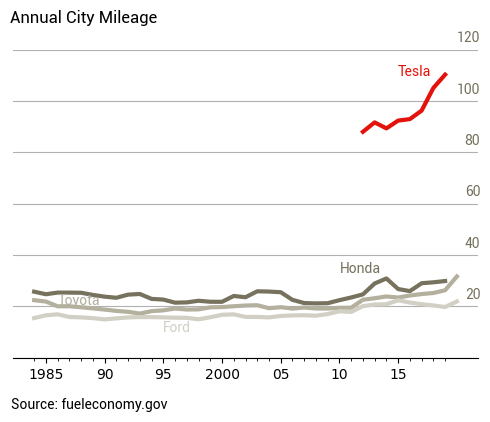

In [74]:
import matplotlib.pyplot as plt
import pandas as pd

url = 'https://github.com/mattharrison/datasets/raw/master/data/vehicles.csv.zip'
autos = pd.read_csv(url)

makes = ['Tesla', 'Honda', 'Toyota', 'Ford']
colors = ['#e3120b', '#76725e', '#b3b09e', '#d2d0c4']
fig, ax = plt.subplots(figsize=(6,4), dpi=100)
ax = (autos
 .loc[autos.make.isin(makes)]
 .groupby(['year', 'make'])
 .city08
 .mean()
 .unstack()
 .loc[:, makes]
 .plot(color=colors, legend=False, linewidth=3, ax=ax)
)
plt.rcParams["font.family"] = "Roboto"
plt.grid(axis='y')
plt.suptitle('Annual City Mileage', ha='left', x=.12)
[ax.spines[side].set_visible(False) for side in ['top', 'left', 'right']]
ax.tick_params(left=False) # hide ticks
ax.set_xlabel('') # clear x label
ax.set_xticks(minor=True, ticks=range(1984,2020))
# set positions and labels for major ticks
ax.set_xticks(ticks=range(1985,2019,5))
ax.set_xticklabels(['1985', '90', '95', '2000', '05', '10', '15'])
ax.set_yticks(ticks=range(0,121,20))
ax.set_yticklabels([]) # hide left hand side
for label in range(20,121,20): # my own vertically shifted y-labels
    ax.text(2022, label+3, f'{label}', color=colors[-3], ha='right')
for label, pos, color in zip(makes, [(2015, 110), # label makes
                              (2010, 33),
                              (1986, 20.5),
                              (1995, 10),
                             ], colors):
    ax.text(*pos, label, color=color, ha='left')
_ = ax.text(1982, -20, 'Source: fueleconomy.gov', ha='left')


## More Line Plots

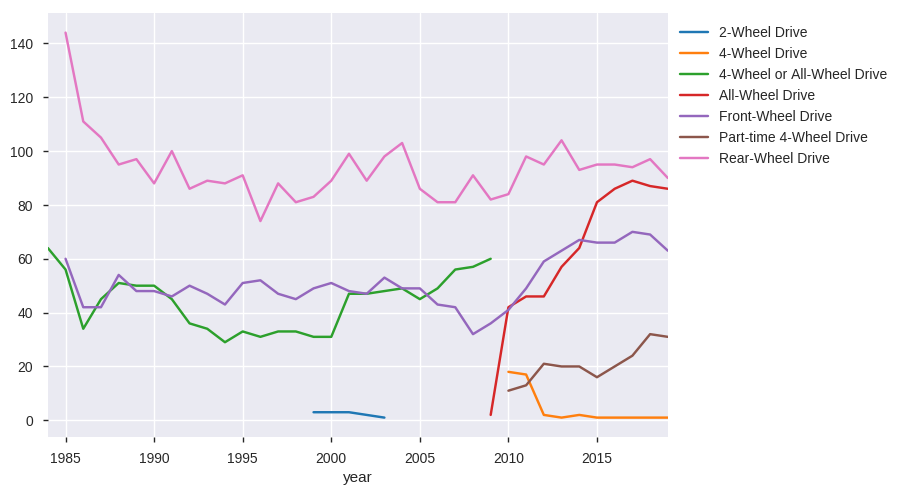

In [ ]:
# time - category counts over time
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .groupby(['year'])
  ['drive']
  .value_counts()
  .unstack()
  .iloc[:-1]
  .plot()
  .legend(bbox_to_anchor=(1,1))
)

(1984, 2019)

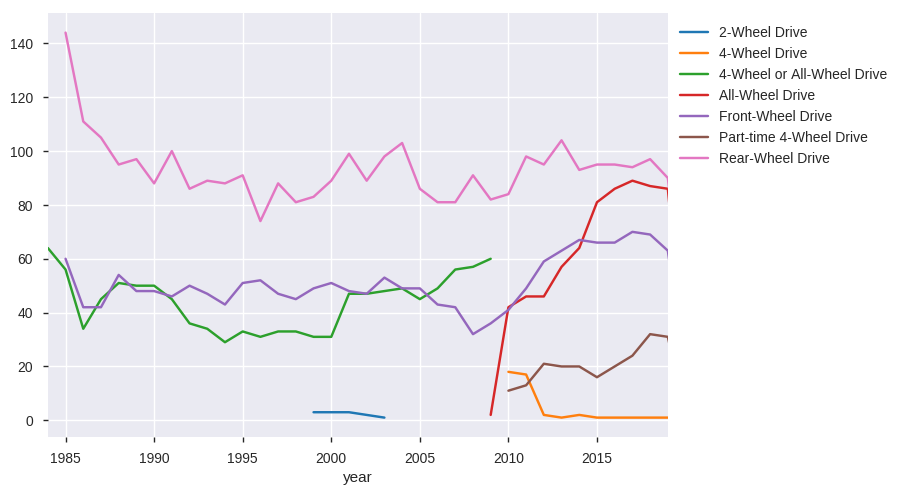

In [ ]:
# remove 2020 as it is missing data
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .groupby(['year'])
  ['drive']
  .value_counts()
  .unstack()
  .plot()

)
ax.legend(bbox_to_anchor=(1,1))
ax.set_xlim(1984, 2019)

(1984, 2019)

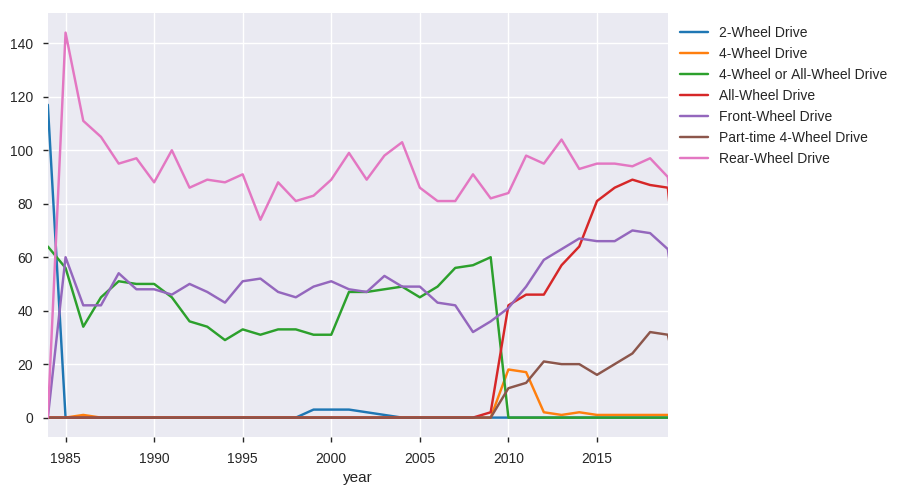

In [ ]:
# Crosstab version
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .pipe(lambda df: pd.crosstab(df.year, df.drive))
  .plot()

)
ax.legend(bbox_to_anchor=(1,1))
ax.set_xlim(1984, 2019)

## Bar Plots

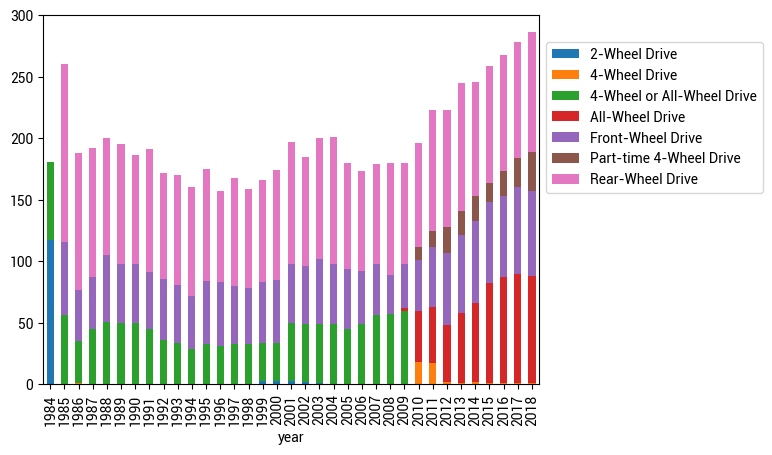

In [75]:
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .pipe(lambda df: pd.crosstab(df.year, df.drive))
  .plot.bar(stacked=True)
)
# bar plot uses 1 for each item, rather than value
ax.set_xlim(-.5, 2018-1984 + .5)
ax.legend(bbox_to_anchor=(1,.5))

(-0.5, 34.5)

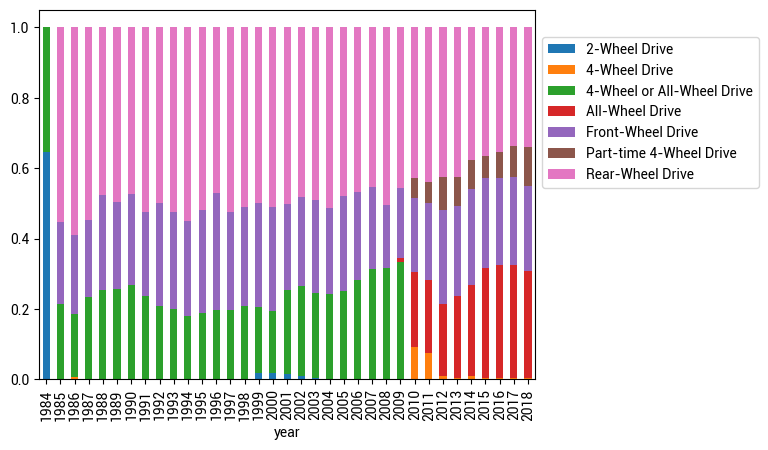

In [76]:
# normalize
# remove 2020 as it is missing data
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .pipe(lambda df: pd.crosstab(df.year, df.drive))
  .pipe(lambda df: df.div(df.sum(1), axis=0))
  .plot.bar(stacked=True)

)
ax.legend(bbox_to_anchor=(1,.5))
# bar plot uses 1 for each item, rather than value
ax.set_xlim(-.5, 2018-1984 + .5)

(0.0, 1.0)

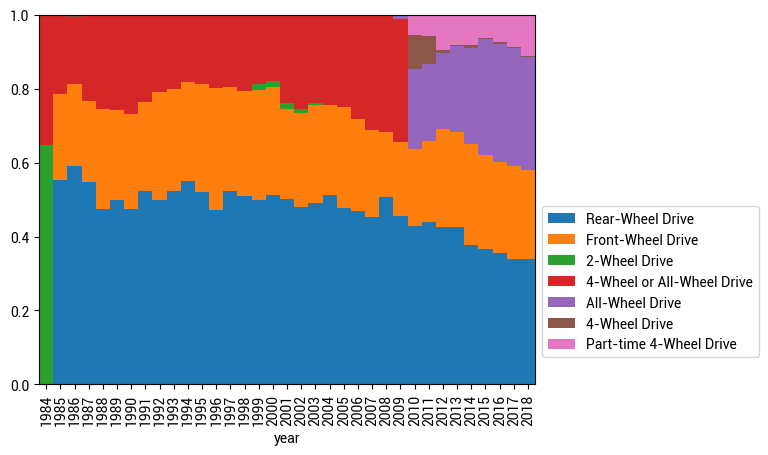

In [77]:
# Adjust order using drives variable
drives = ['Rear-Wheel Drive', 'Front-Wheel Drive',
          '2-Wheel Drive',
          '4-Wheel or All-Wheel Drive',
          'All-Wheel Drive',
          '4-Wheel Drive',
          'Part-time 4-Wheel Drive', ]
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax = (auto
  [mask]
  .pipe(lambda df: pd.crosstab(df.year, df.drive))
  .pipe(lambda df: df.div(df.sum(1), axis=0))
  [drives]
  .plot.bar(stacked=True, width=1)
)
ax.legend(bbox_to_anchor=(1,.5))
# bar plot uses 1 for each item, rather than value
ax.set_xlim(-.5, 2018-1984 + .5)
ax.set_ylim(0, 1)

## Categorical vs Numeric

Text(0.5, 1.0, 'Avg City08')

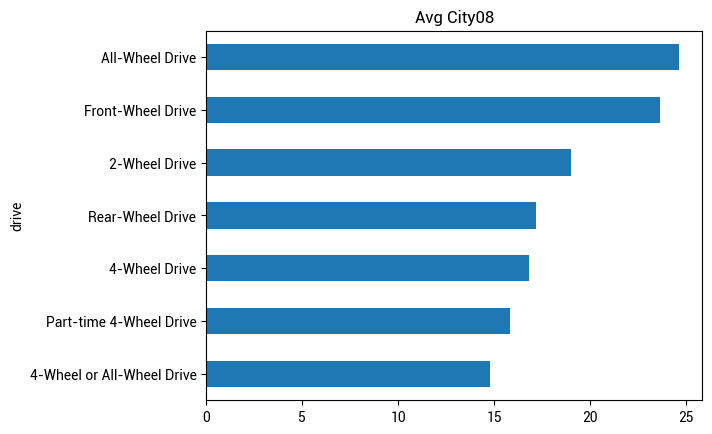

In [78]:
# categorical vs numeric (although year is somewhat categorical)
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax =(auto
  [mask]
  .groupby(['drive'])
  ['city08']
  .mean()
  .sort_values()
  .plot.barh()
)
ax.set_title('Avg City08')

Text(0.5, 1.0, 'Avg City08')

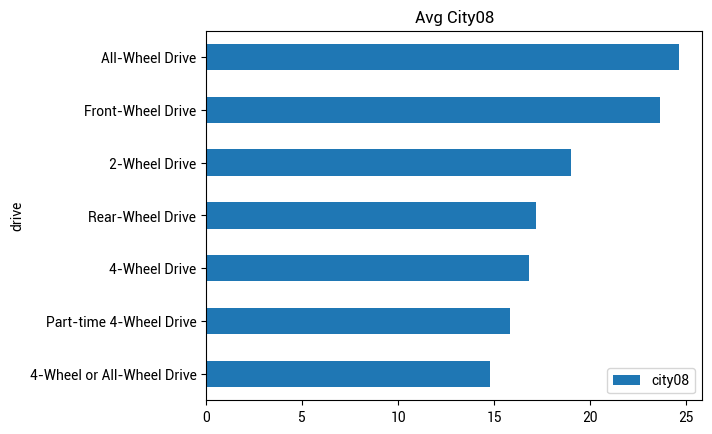

In [79]:
# categorical vs numeric (although year is somewhat categorical)
mask = auto.make.isin(['Ford', 'Tesla', 'Toyota', 'BMW'])
ax =(auto
  [mask]
  .pipe(lambda df: pd.pivot_table(df, index='drive', values='city08', aggfunc='mean'))
  .sort_values(by='city08')
  .plot.barh()
)
ax.set_title('Avg City08')

## PCA

In [3]:
# PCA
cols = ['charge120', 'city08', 'comb08', 'cylinders', 'drive', 'highway08', 'make',  'year', 'range', 'trany']
# standardize data
model = pipeline.Pipeline([('std', preprocessing.StandardScaler()),
                            ('pca', decomposition.PCA(random_state=42))])
X = pd.get_dummies(auto[cols], drop_first=True).fillna(0)
X_pca = model.fit_transform(X)
pca = model.named_steps['pca']

In [4]:
X_pca

array([[ 4.01034041e-02, -1.11004770e+00,  1.03677536e+00, ...,
         1.08429624e-02,  1.08144526e-04,  0.00000000e+00],
       [-3.74183523e+00,  5.29893222e-01,  1.59928994e+00, ...,
        -7.03953759e-03, -3.62249380e-04,  0.00000000e+00],
       [ 1.61938867e+00, -2.18349162e+00, -8.35878731e-02, ...,
        -7.23983500e-03, -1.44979101e-03,  0.00000000e+00],
       ...,
       [-1.89620464e-01, -1.44852169e+00,  1.60040368e-01, ...,
        -1.25868553e-02, -5.37318638e-04,  0.00000000e+00],
       [ 1.98270178e-01, -1.63009251e+00, -2.65005364e-01, ...,
        -1.64188030e-02, -4.24046635e-04,  0.00000000e+00],
       [-6.35420360e-01, -1.47937783e+00,  7.55190057e-02, ...,
        -4.63511825e-03,  9.87245503e-05,  0.00000000e+00]])

In [5]:
X_pca.shape

(41144, 184)

In [6]:
pd.DataFrame(X_pca, columns=[f'PC{i}' for i in range(1, X_pca.shape[1]+1)])

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC175,PC176,PC177,PC178,PC179,PC180,PC181,PC182,PC183,PC184
0,0.040103,-1.110048,1.036775,-0.103815,-0.484498,1.130538,0.193386,1.768144,-0.152058,0.709264,...,-0.083126,-0.122876,-0.324194,0.028888,0.200304,-0.052751,-0.022526,0.010843,0.000108,0.0
1,-3.741835,0.529893,1.599290,-0.205221,-3.143712,-0.776884,0.677557,0.738010,4.474710,1.859452,...,1.425386,0.191685,0.121526,-0.191308,0.125650,0.056071,0.034640,-0.007040,-0.000362,0.0
2,1.619389,-2.183492,-0.083588,0.257539,-0.047501,0.482569,0.252826,1.182338,-0.011415,-0.033256,...,0.357709,-0.120847,-0.680828,-0.198549,0.213717,0.192300,0.035533,-0.007240,-0.001450,0.0
3,-2.923894,-1.241443,1.196387,-0.454656,-0.524067,0.193120,0.238052,2.068860,-1.006183,-0.365122,...,-0.042277,0.565482,0.071103,0.096499,0.194834,-0.036988,0.024364,-0.010224,0.001601,0.0
4,-0.024860,-1.644308,-0.310800,-0.368002,3.190777,1.565604,0.148512,-0.809119,1.785426,-0.347062,...,-0.019632,-0.004867,-0.164748,0.139765,0.028593,0.027429,-0.034273,-0.003206,0.000098,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41139,0.815781,-1.664168,-0.529969,-0.160615,1.107714,0.231205,0.051275,-0.768256,-0.016339,-0.315770,...,0.238260,0.025039,-0.365876,0.222117,0.013604,-0.085532,0.039243,-0.011670,-0.000045,0.0
41140,1.426341,-1.829098,-0.916288,0.097286,1.526705,1.102962,0.331125,0.008068,1.020057,-0.293088,...,0.237641,0.277951,-0.244607,0.212036,0.008352,-0.034181,-0.001952,-0.010241,-0.000045,0.0
41141,-0.189620,-1.448522,0.160040,-0.619217,2.744934,0.700177,-0.129322,-1.571927,0.748491,-0.368869,...,-0.000129,-0.087629,-0.308709,-0.022088,0.053974,0.045875,0.074801,-0.012587,-0.000537,0.0
41142,0.198270,-1.630093,-0.265005,-0.365012,3.179075,1.569354,0.149058,-0.804364,1.785957,-0.346534,...,-0.009782,0.084415,-0.170483,0.069621,0.040321,0.009026,0.071071,-0.016419,-0.000424,0.0


In [7]:
model.steps

[('std', StandardScaler()), ('pca', PCA(random_state=42))]

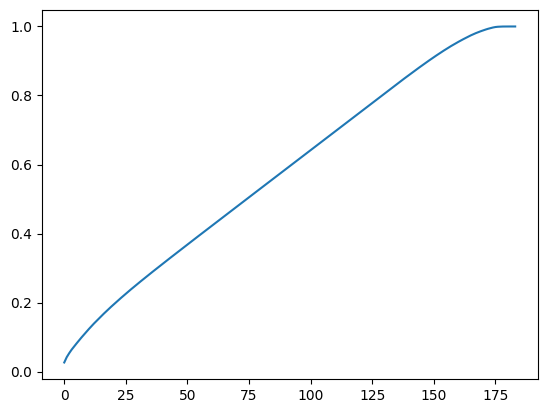

In [8]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [9]:
# How original columns impact each component
pd.DataFrame(pca.components_, columns=X.columns, index=[f'PC{i}' for i in range(1, pca.n_components_+1)])

,charge120,city08,comb08,cylinders,highway08,year,range,drive_4-Wheel Drive,drive_4-Wheel or All-Wheel Drive,drive_All-Wheel Drive,...,trany_Automatic 6-spd,trany_Automatic 7-spd,trany_Automatic 8-spd,trany_Automatic 9-spd,trany_Manual 3-spd,trany_Manual 4-spd,trany_Manual 4-spd Doubled,trany_Manual 5-spd,trany_Manual 6-spd,trany_Manual 7-spd
PC1,-0.0,0.423665,0.434887,-0.321867,0.434495,0.112269,0.282351,-0.015401,-0.111154,0.060609,...,-0.014326,-0.024618,-0.014161,0.011208,-0.019557,-0.035719,0.005414,0.054758,0.022687,-0.002703
PC2,-0.0,0.016652,0.024773,0.207305,0.043701,0.462218,0.083547,0.182185,-0.108630,0.287639,...,0.091251,0.150544,0.087996,0.076684,-0.012542,-0.097218,-0.015387,-0.224001,0.112474,0.062998
PC3,0.0,0.126486,0.094301,0.129221,0.040353,-0.201001,0.424251,0.005032,0.039494,-0.171417,...,-0.020063,0.118096,0.015350,0.003441,0.042196,0.108115,0.005299,-0.029116,-0.073433,0.011200
PC4,0.0,0.000448,0.005698,-0.057351,0.011198,0.064165,-0.127796,0.380995,-0.067801,-0.256012,...,0.052043,0.424303,0.055270,0.220093,-0.019399,-0.047277,0.001252,0.031409,-0.016990,0.089735
PC5,0.0,-0.006525,-0.018997,-0.058493,-0.045804,-0.051999,0.120436,0.166284,0.440572,0.186451,...,-0.054536,0.032698,0.016391,0.070270,-0.010659,0.106461,0.008238,0.099415,-0.086299,0.079907
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PC180,-0.0,-0.596784,-0.126676,0.014897,0.696471,-0.005671,0.266111,0.027144,0.060340,0.022978,...,-0.004950,-0.012072,-0.012656,-0.009098,0.013556,0.031681,0.004287,0.014427,-0.020340,-0.006530
PC181,0.0,-0.494466,0.794814,0.007589,-0.303362,-0.001610,0.024570,-0.001260,-0.000569,0.000430,...,0.037874,0.026624,0.020842,0.016058,0.007819,0.033121,0.002896,0.075142,0.049070,0.010440
PC182,0.0,0.138184,-0.125775,0.002463,0.016123,0.001357,0.056586,-0.001377,-0.002156,-0.002086,...,0.206732,0.139432,0.108161,0.089113,0.045611,0.196729,0.021072,0.426569,0.265473,0.055678
PC183,-0.0,0.003563,-0.003532,-0.000319,-0.000404,0.000108,0.000023,-0.000471,-0.000975,-0.000633,...,0.000593,0.000388,0.000345,0.000271,0.000068,0.000474,0.000026,0.001182,0.000768,0.000164


In [10]:
# How original columns impact each component
(pd.DataFrame(pca.components_, columns=X.columns, index=[f'PC{i}' for i in range(1, pca.n_components_+1)])
.loc[['PC1', 'PC2', 'PC3']]
# find columns with abs > .3
.loc[:, lambda df: (df.abs() > .3).any(axis='index')]
)

,city08,comb08,cylinders,highway08,year,range,drive_Rear-Wheel Drive,make_Tesla
PC1,0.423665,0.434887,-0.321867,0.434495,0.112269,0.282351,-0.166269,0.222457
PC2,0.016652,0.024773,0.207305,0.043701,0.462218,0.083547,0.145151,0.080416
PC3,0.126486,0.094301,0.129221,0.040353,-0.201001,0.424251,0.345184,0.399990


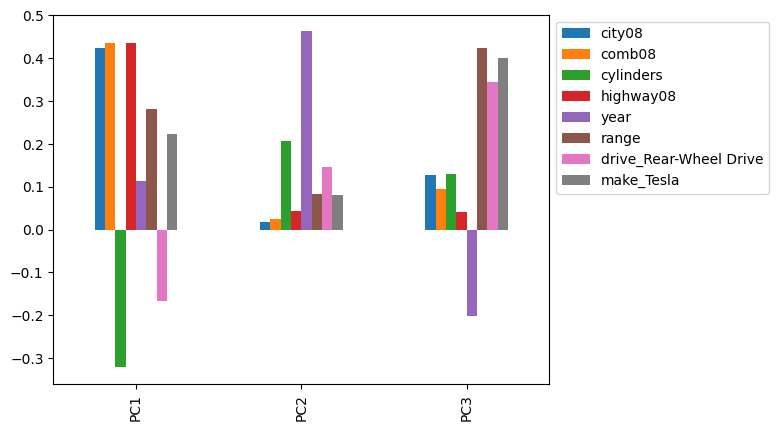

In [11]:
# How original columns impact each component
(pd.DataFrame(pca.components_, columns=X.columns, index=[f'PC{i}' for i in range(1, pca.n_components_+1)])
.loc[['PC1', 'PC2', 'PC3']]
# find columns with abs > .3
.loc[:, lambda df: (df.abs() > .3).any(axis='index')]
.plot.bar()
.legend(bbox_to_anchor=(1,1))
)

## Scatter Plot of PCA with Plotly

<Axes: xlabel='PC1', ylabel='PC2'>

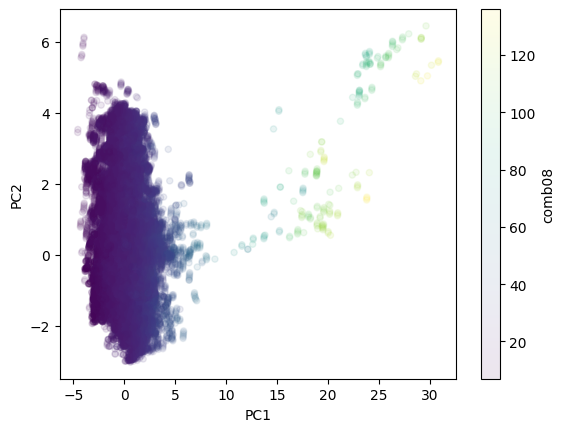

In [12]:
(pd.DataFrame(X_pca, columns=[f'PC{i}' for i in range(1, X_pca.shape[1]+1)])
.assign(**auto)
.plot.scatter(x='PC1', y='PC2', alpha=.1, c='comb08', cmap='viridis')
)

In [20]:
import plotly.express as px
# sampling because it takes too long with 40,000 points
fig = px.scatter_3d(data:=pd.DataFrame(X_pca, columns=[f'PC{i}' for i in range(1, X_pca.shape[1]+1)]).assign(**auto)
    .sample(2_000, random_state=42),
                x='PC1', y='PC2', z='PC3', color='comb08', hover_data=auto.columns,
                color_continuous_scale='viridis')
fig.update_layout(
    width=800,
    height=600,
    title='3D PCA Scatter Plot'
)      
fig.update_traces(marker=dict(size=3))

fig.show()

## Clustering

In [21]:
# Clustering

cols = ['charge120', 'city08', 'comb08', 'cylinders', 'drive', 'highway08', 'make',  'year', 'range', 'trany']
# standardize data
cmodel = pipeline.Pipeline([('std', preprocessing.StandardScaler()),
                            ('cluster', cluster.KMeans(n_clusters=5, random_state=42))])
X = pd.get_dummies(auto[cols], drop_first=True).fillna(0)
cmodel.fit(X)

labels = cmodel.predict(X)

In [27]:
(auto
.assign(cluster=labels)
.groupby('cluster')
.mean(numeric_only=True)
.style.background_gradient(cmap='RdBu', axis='index')
)

,barrels08,barrelsA08,charge120,charge240,city08,city08U,cityA08,cityA08U,cityCD,cityE,cityUF,co2,co2A,co2TailpipeAGpm,co2TailpipeGpm,comb08,comb08U,combA08,combA08U,combE,combinedCD,combinedUF,cylinders,displ,engId,feScore,fuelCost08,fuelCostA08,ghgScore,ghgScoreA,highway08,highway08U,highwayA08,highwayA08U,highwayCD,highwayE,highwayUF,hlv,hpv,id,lv2,lv4,phevBlended,pv2,pv4,range,rangeCity,rangeCityA,rangeHwy,rangeHwyA,UCity,UCityA,UHighway,UHighwayA,year,youSaveSpend,charge240b,phevCity,phevHwy,phevComb
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,13.871962,0.108205,0.000000,0.103638,22.671818,7.910489,0.717863,0.605480,0.000096,0.590071,0.002342,71.662924,2.427463,8.244220,374.187902,25.227324,8.598853,0.749085,0.619305,0.614698,0.000048,0.002279,4.491725,2.287431,10068.105210,0.718115,1849.776082,40.198057,0.715340,-0.938501,29.612716,9.781881,0.816702,0.658388,0.000000,0.645908,0.002196,4.027501,21.134982,20447.430806,2.515454,9.635108,0.002965,17.763214,52.077835,2.059291,1.982010,0.149576,1.903981,0.131159,29.111058,0.967796,41.847402,1.150742,2001.413208,-1492.746310,0.025091,0.262016,0.240444,0.251545
1,16.254511,0.320683,0.000000,0.043929,18.358889,15.955307,1.452549,1.444460,0.000371,0.733941,0.006231,318.684211,12.716535,21.273042,437.788460,21.134273,18.341439,1.546208,1.529167,0.717364,0.000538,0.006276,6.389557,3.561334,435.549523,3.351430,2429.714049,102.838790,3.336925,-0.834231,26.077911,22.529236,1.708661,1.685203,0.000688,0.698301,0.006341,0.779942,3.347286,34078.270617,1.879403,7.903025,0.012847,15.007460,51.803564,0.000000,0.000000,0.275769,0.000000,0.281521,23.143217,2.026738,36.850330,2.454248,2013.813925,-4370.078740,0.000000,0.516370,0.580605,0.541235
2,15.459199,0.000000,0.000000,0.000000,19.230548,8.059828,0.000000,0.000000,0.000000,0.000000,0.000000,117.544669,-1.000000,0.000000,416.575973,21.786744,9.129047,0.000000,0.000000,0.000000,0.000000,0.000000,5.244957,2.859942,6574.472622,1.051873,2337.175793,0.000000,1.051873,-1.000000,26.227666,10.980393,0.000000,0.000000,0.000000,0.000000,0.000000,2.613833,13.576369,23660.429395,1.383285,7.832853,0.000000,8.654179,53.734870,0.000000,0.000000,0.000000,0.000000,0.000000,24.349252,0.000000,37.010337,0.000000,2005.481268,-3935.878963,0.000000,0.000000,0.000000,0.000000
3,16.420041,0.041863,0.000000,0.081772,18.177172,18.092632,1.262351,1.260944,0.004379,1.730835,0.009923,425.143101,-1.000000,0.000000,441.244712,20.780239,20.727440,1.362862,1.365688,1.662692,0.002555,0.009930,6.713799,3.645997,243.708688,4.216354,2589.182283,27.257240,4.265758,-1.000000,25.366269,25.291924,1.538330,1.543257,0.000052,1.574106,0.009912,0.492334,2.063032,37153.693356,3.161840,3.395230,0.005111,35.960818,22.860307,0.000000,0.000000,0.397428,0.000000,0.396405,22.783558,1.768647,35.481495,2.203652,2016.439523,-5143.526405,0.000000,0.683135,0.836457,0.747871
4,19.914216,0.298497,0.000000,0.002240,15.252882,3.129113,0.536253,0.344796,0.000638,0.051757,0.000325,64.893588,7.925671,24.717200,537.565416,17.205122,3.584564,0.611858,0.391799,0.050864,0.000506,0.000325,6.497858,3.980390,7880.426924,-0.343025,2719.584833,119.361528,-0.344575,-0.914004,20.590758,4.374612,0.734539,0.472774,0.000370,0.049788,0.000326,0.712528,3.341020,18904.852390,1.256346,3.418949,0.000592,9.784305,18.603245,0.000000,0.000000,0.013170,0.000000,0.013208,18.936308,0.645180,28.574057,0.984899,1999.812104,-5846.488630,0.000000,0.023151,0.026933,0.024700


<Axes: xlabel='PC1', ylabel='PC2'>

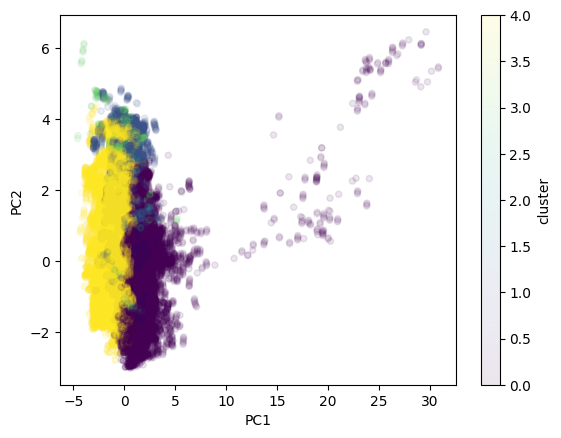

In [28]:
(pd.DataFrame(X_pca, columns=[f'PC{i}' for i in range(1, X_pca.shape[1]+1)])
.assign(**auto,
        cluster=labels)
.plot.scatter(x='PC1', y='PC2', alpha=.1, c='cluster', cmap='viridis')
)

In [29]:
import plotly.express as px
# sampling because it takes too long with 40,000 points
fig = px.scatter_3d(data:=pd.DataFrame(X_pca, columns=[f'PC{i}' for i in range(1, X_pca.shape[1]+1)]).assign(**auto,
        cluster=labels)
    .sample(2_000, random_state=42),
                x='PC1', y='PC2', z='PC3', color='cluster', hover_data=auto.columns,
                color_continuous_scale='viridis')
fig.update_layout(
    width=800,
    height=600,
    title='3D PCA Scatter Plot'
)      
fig.update_traces(marker=dict(size=3))

fig.show()